In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from itertools import combinations
import csv
from scipy.signal import resample_poly
import umap
from scipy.stats import pearsonr
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from pathlib import Path
import glob
import shutil
import os
import pickle


import sys
sys.path.append('/storage3/eva/code/remapping/src')
import path_formatting as pf
import motive
import oe
import utils
import umap_tools

/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
date = "20250922"
animal = "eb03"

#help(utils.path_load)
_, ks_path, csv_path, res_path = utils.path_load(date, animal,p=True)

pa_path = Path(res_path) / "pa" 
pa_path.mkdir(parents=True, exist_ok=True)

Ola! For folders inside of res_path: Path(res_path)/"folder_name"
To make new folder (if not exist): your_path.mkdir(parents=True, exist_ok=True)


In [3]:
# Prepare inputs

data = umap_tools.prepare_umap_inputs(
    animal=animal,
    date=date,
    ks_path=ks_path,
    res_path=res_path,
    csv_path=csv_path
)
print(data.keys())

Sup! U have...
59 phy-good clusters
Running accumarray... be patient :)
dict_keys(['spike_matrix', 'pitch', 'pos_data', 'speeds', 'spike_matrix_run', 'pitch_run', 'pos_data_run', 'speeds_run', 'bin_centers_sec', 'cell_ids', 'of_keys', 'sl_keys', 'periods', 'goodspiketimes'])


In [4]:
# Load unit classes (pyr vs inter)
unit_class_path = Path(res_path) / f"unit_classes_{date}.pkl"

all_units, pyr_units, inter_units = umap_tools.neuronal_classes(
    unit_class_path,
    list(data['goodspiketimes'].keys())
)

print(f"Total units: {len(all_units)} | Pyr: {len(pyr_units)} | Inter: {len(inter_units)}")

Total units: 67 | Pyr: 44 | Inter: 10


In [4]:
data.keys()

dict_keys(['spike_matrix', 'pitch', 'pos_data', 'speeds', 'spike_matrix_run', 'pitch_run', 'pos_data_run', 'speeds_run', 'bin_centers_sec', 'cell_ids', 'of_keys', 'sl_keys', 'periods', 'goodspiketimes'])

In [5]:
# 22sep
pyr_units = [613,623,637,641,647,651,659,671,683,687,709,715,717,731,734,738,742,752,
       815,852,864,886,900,910,913,914]
pyr_u = [645,667,681,798,815,819,862,858,860,866,894,912]
inter_units = [595,597,601,607,609,615,619,621,633,663,707,768,782]
noise = [681,719,721,744,750,754,758,760,882,901]

all_units = list(data['goodspiketimes'].keys())

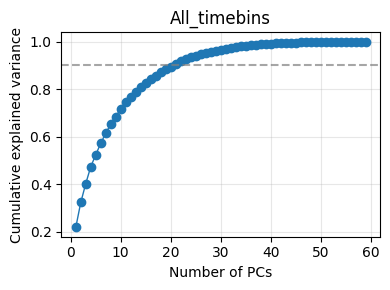

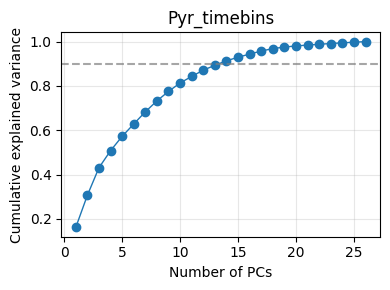

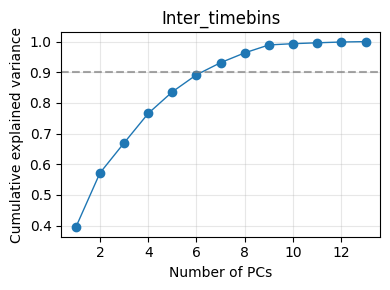

In [7]:
# optional: Run PCA on time-binned spike matrices

pca_results = umap_tools.run_pca_by_class(
    spike_matrices_dict=data['spike_matrix_run'],  # use speed-filtered
    keys=data['of_keys'],                          # only open fields
    all_units=all_units,
    pyr_units=pyr_units,
    inter_units=inter_units,
    scale=False, # dont forget to play with it!!!!
    n_components=None
)

# Explained variance plot
umap_tools.plot_pca_exp_var(pca_results['evr_all'], title="All_timebins")
umap_tools.plot_pca_exp_var(pca_results['evr_pyr'], title="Pyr_timebins")
umap_tools.plot_pca_exp_var(pca_results['evr_inter'], title="Inter_timebins")

In [8]:
n_pyr_pc = 12
n_inter_pc = 6

In [9]:
# run umap
umap_kwargs = dict(n_neighbors=15, min_dist=0.1, metric="euclidean", random_state=42)

emb_pyr_split = umap_tools.run_umap(pca_results['pc_pyr'][:,:n_pyr_pc], umap_kwargs=umap_kwargs, split=True, boundaries=pca_results['boundaries'])
emb_int_split = umap_tools.run_umap(pca_results['pc_inter'][:,:n_inter_pc], umap_kwargs=umap_kwargs, split=True, boundaries=pca_results['boundaries'])

/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [10]:
pyr_dict  = {k: v for k, v in zip(data['of_keys'], emb_pyr_split)}
inter_dict = {k: v for k, v in zip(data['of_keys'], emb_int_split)}

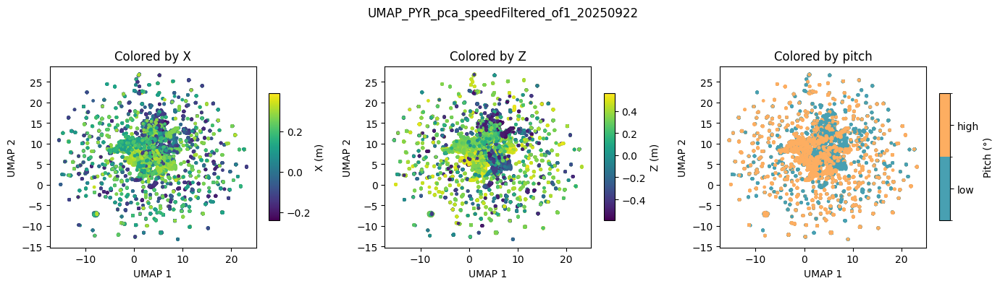

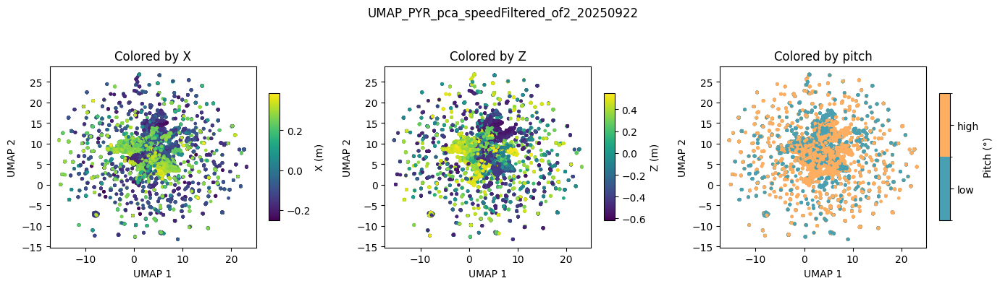

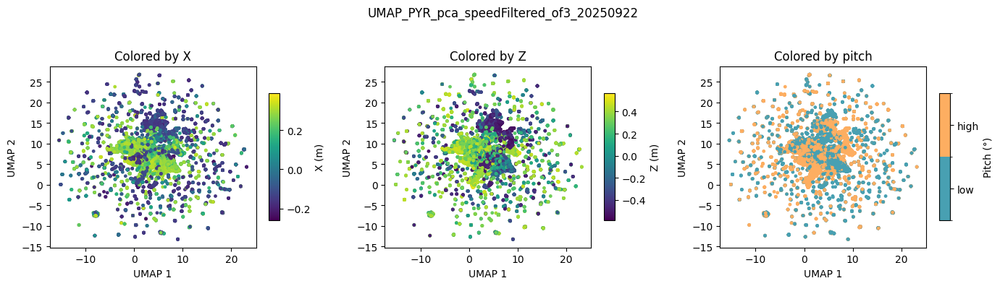

In [11]:
for of in data['of_keys']:
    emb = pyr_dict[of]
    pos_dict = data['pos_data_run'][of]
    pitch_deg = data['pitch_run'][of]
    umap_tools.plot_umap_by_position(
        emb=emb,
        pos_dict=pos_dict,
        pitch_deg=pitch_deg,
        celltype="PYR_pca",
        of=of,
        date=date,
        save_path=pa_path
    )

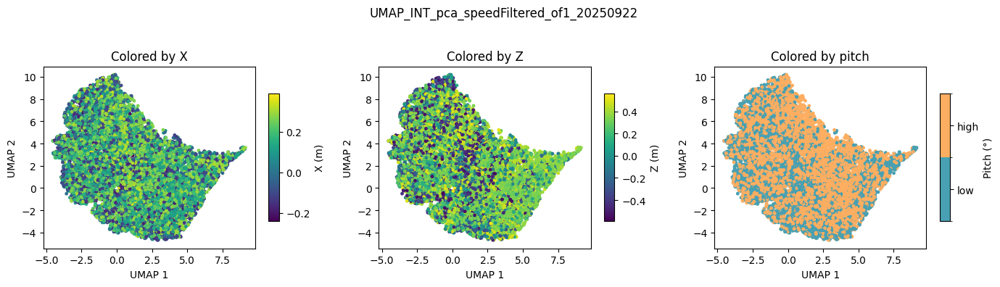

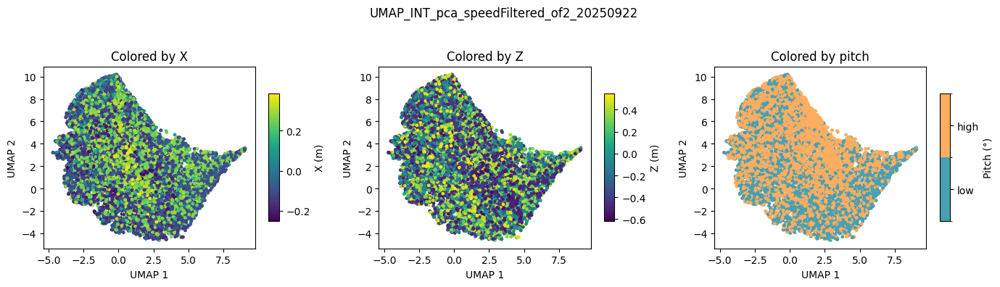

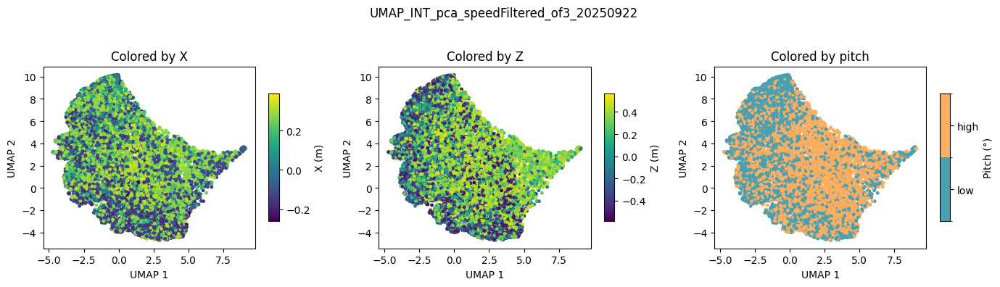

In [12]:
for of in data['of_keys']:
    emb = inter_dict[of]
    pos_dict = data['pos_data_run'][of]
    pitch_deg = data['pitch_run'][of]
    umap_tools.plot_umap_by_position(
        emb=emb,
        pos_dict=pos_dict,
        pitch_deg=pitch_deg,
        celltype="INT_pca",
        of=of,
        date=date,
        save_path=pa_path
    )

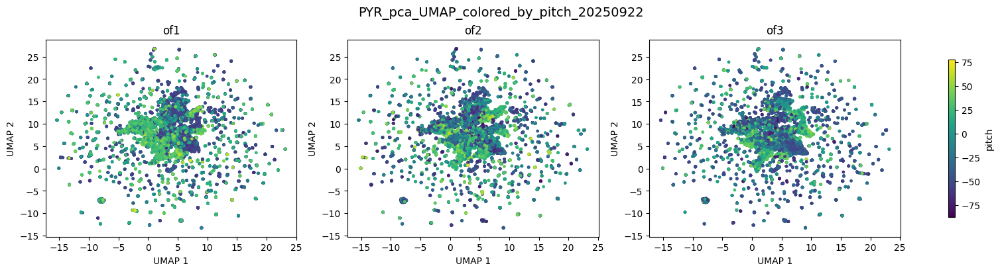

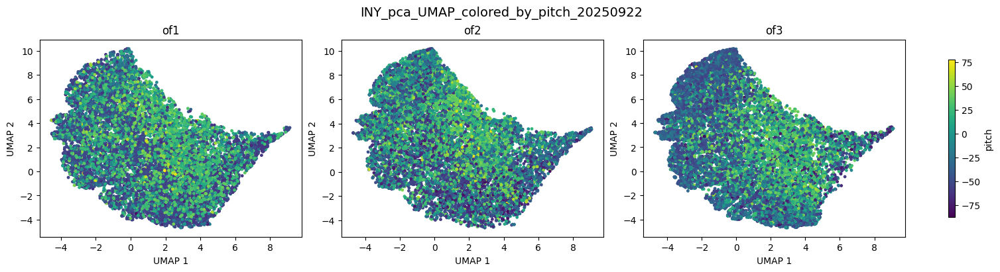

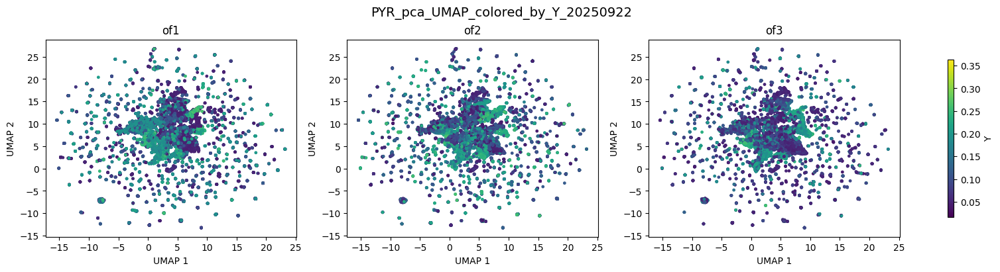

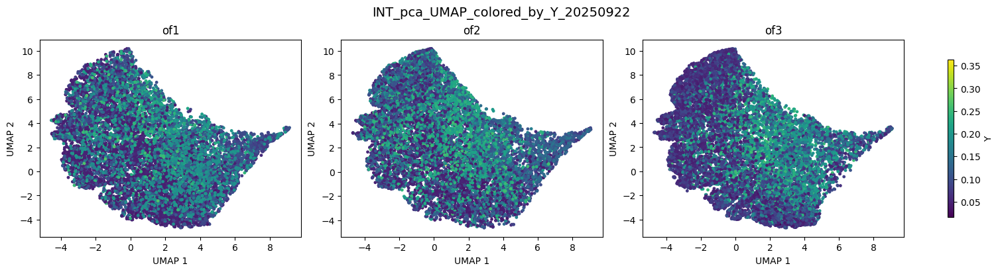

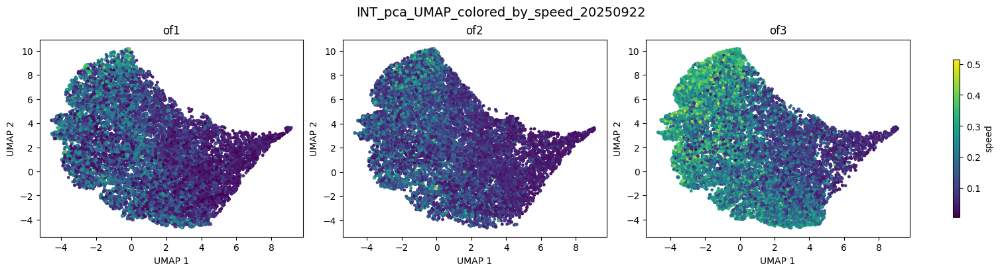

In [13]:
plot_configs = [
    dict(ur_emb=pyr_dict, arr_run=data['pitch_run'], color_variable="pitch", celltype="PYR_pca"),
    dict(ur_emb=inter_dict, arr_run=data['pitch_run'], color_variable="pitch", celltype="INY_pca"),
    dict(ur_emb=pyr_dict, arr_run={k: data['pos_data_run'][k]['Y'] for k in data['of_keys']}, color_variable="Y", celltype="PYR_pca"),
    dict(ur_emb=inter_dict, arr_run={k: data['pos_data_run'][k]['Y'] for k in data['of_keys']}, color_variable="Y", celltype="INT_pca"),
    dict(ur_emb=inter_dict, arr_run={k: data['speeds_run'][k] for k in data['of_keys']}, color_variable="speed", celltype="INT_pca"),
]

for cfg in plot_configs:
    umap_tools.plot_umap_by_scalar(
        ur_emb=cfg["ur_emb"],
        arr_run=cfg["arr_run"],
        of_keys=data['of_keys'],
        color_variable=cfg["color_variable"],
        celltype=cfg["celltype"],
        date=date,
        save_path=pa_path,
    )

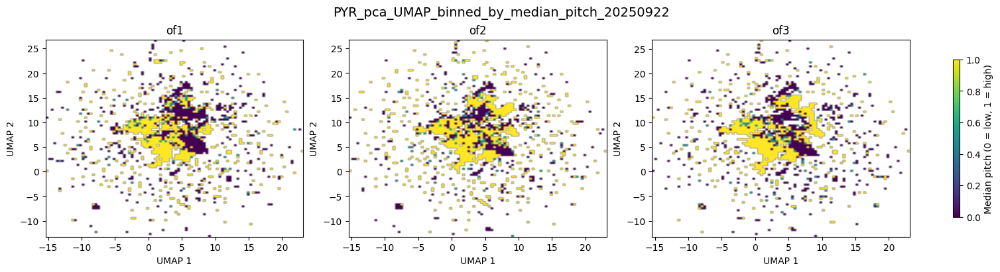

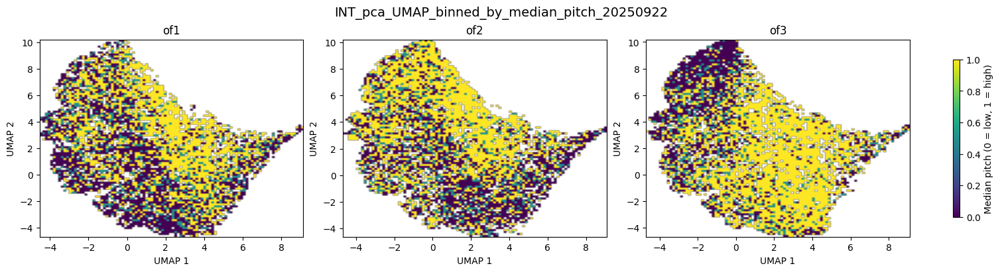

In [14]:
umap_tools.plot_umap_binned_median_pitch(
    ur_emb=pyr_dict,
    pitch_dict=data['pitch_run'],  # continuous pitch in deg
    of_keys=data['of_keys'],
    celltype="PYR_pca",
    date=date,
    save_path=pa_path,
    nbins=100
)

umap_tools.plot_umap_binned_median_pitch(
    ur_emb=inter_dict,
    pitch_dict=data['pitch_run'],  # continuous pitch in deg
    of_keys=data['of_keys'],
    celltype="INT_pca",
    date=date,
    save_path=pa_path,
    nbins=100
)

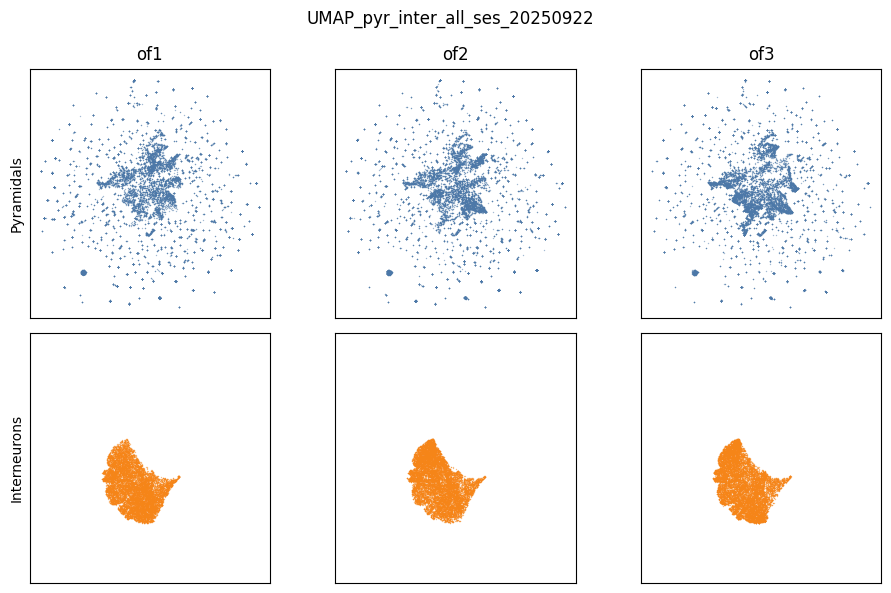

In [15]:
umap_tools.plot_umap_grid_by_class(
    pyr_dict=pyr_dict,
    inter_dict=inter_dict,
    conds=data['of_keys'],
    date=date,
    save_path=pa_path
)

In [88]:
# from itertools import product

# for n, d in product([5, 15, 30], [0.01, 0.1, 0.5]):
#     umap_kwargs = dict(n_neighbors=n, min_dist=d, metric="euclidean", random_state=42)
#     emb_split = umap_tools.run_umap(pca_results['pc_pyr'][:,:n_pyr_pc], umap_kwargs=umap_kwargs, split=True, boundaries=pca_results['boundaries'])
#     pyr_dict  = {k: v for k, v in zip(data['of_keys'], emb_split)}
    

#     # plot and title each
#     print(f"Y (n={n}, d={d})")
#     umap_tools.plot_umap_by_scalar(
#         ur_emb=pyr_dict, 
#         arr_run=data['pitch_run'], 
#         of_keys=data['of_keys'],
#         color_variable=f"Pitch", 
#         celltype="Pyr",
#         date=date,
#         save_path=pa_path
#     )

/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


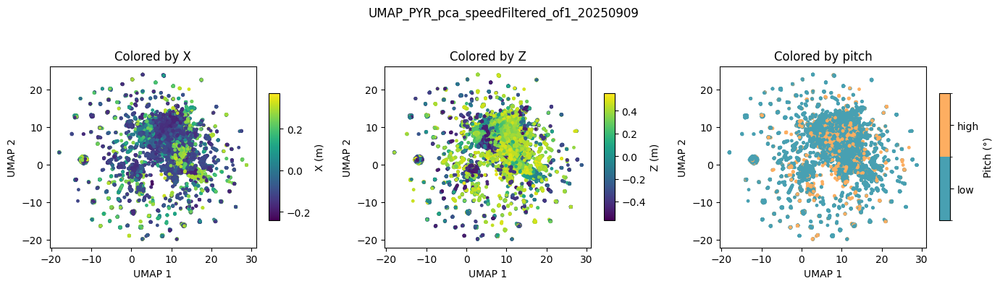

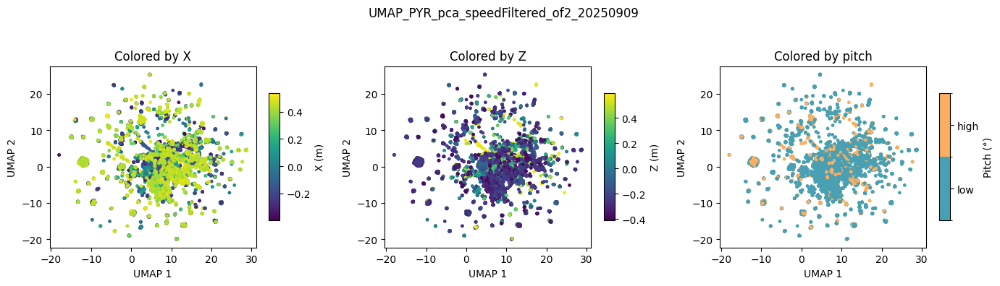

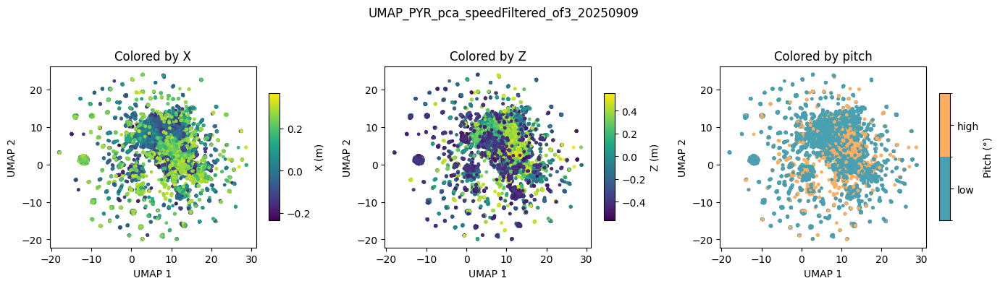

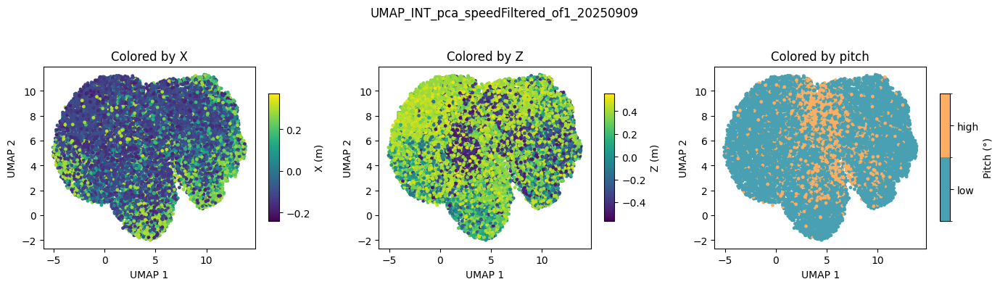

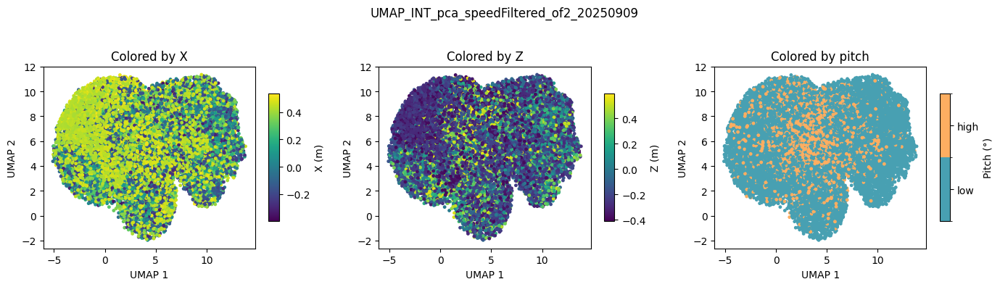

...

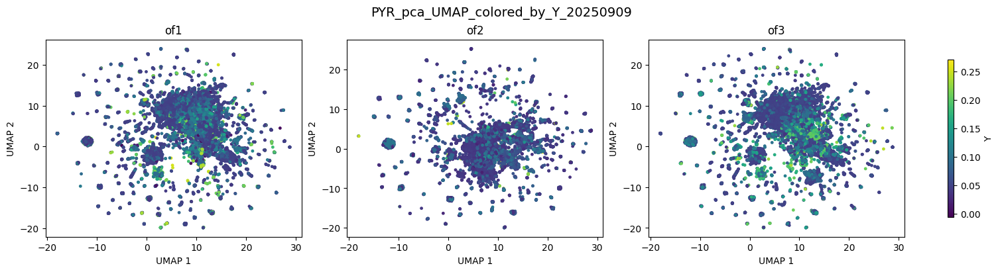

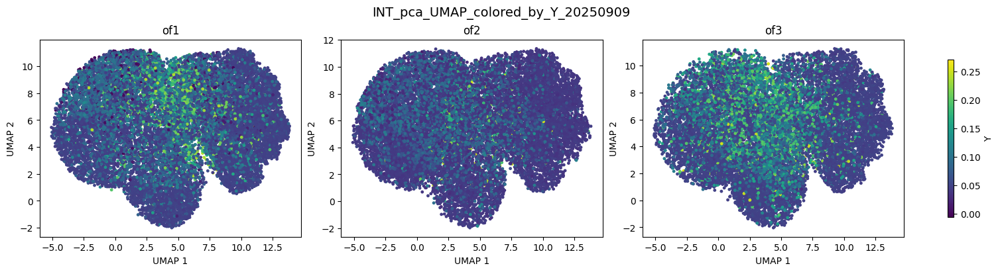

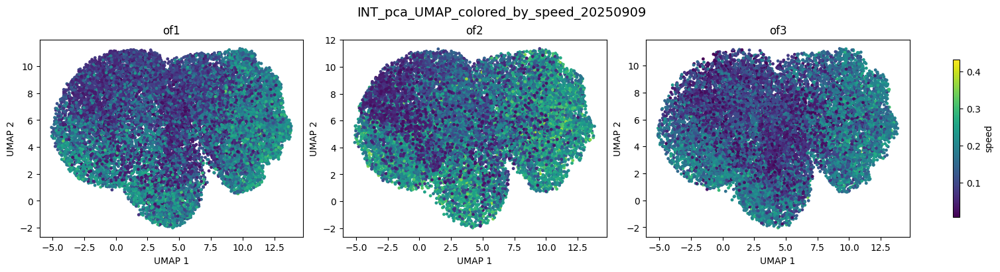

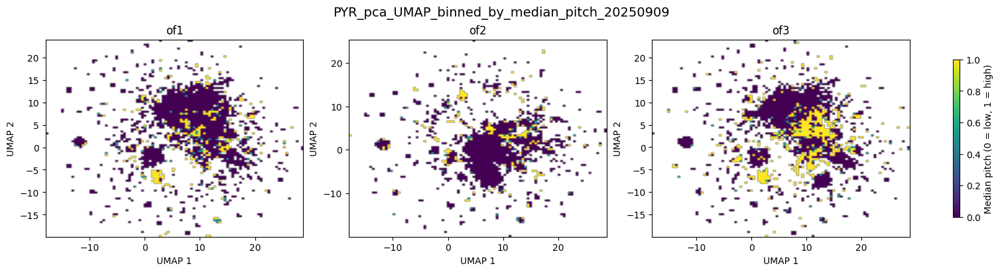

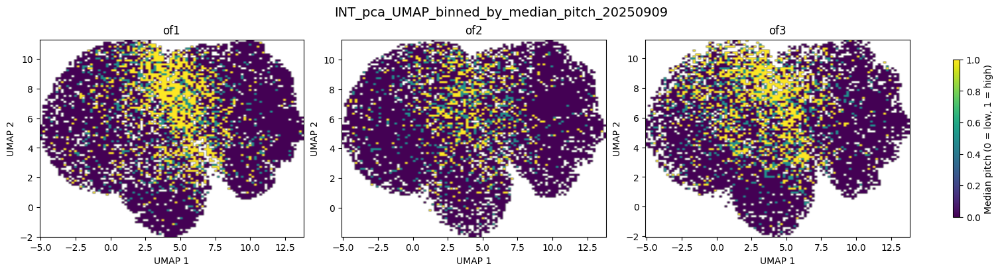

In [92]:
# cosine, z-scored, pca --> umap

# run umap
umap_kwargs = dict(n_neighbors=20, min_dist=0.5, metric="cosine", random_state=42)

emb_pyr_split = umap_tools.run_umap(pca_results['pc_pyr'][:,:n_pyr_pc], umap_kwargs=umap_kwargs, split=True, boundaries=pca_results['boundaries'])
emb_int_split = umap_tools.run_umap(pca_results['pc_inter'][:,:n_inter_pc], umap_kwargs=umap_kwargs, split=True, boundaries=pca_results['boundaries'])

pyr_dict  = {k: v for k, v in zip(data['of_keys'], emb_pyr_split)}
inter_dict = {k: v for k, v in zip(data['of_keys'], emb_int_split)}

for of in data['of_keys']:
    emb = pyr_dict[of]
    pos_dict = data['pos_data_run'][of]
    pitch_deg = data['pitch_run'][of]
    umap_tools.plot_umap_by_position(
        emb=emb,
        pos_dict=pos_dict,
        pitch_deg=pitch_deg,
        celltype="PYR_pca",
        of=of,
        date=date,
        save_path=pa_path
    )

for of in data['of_keys']:
    emb = inter_dict[of]
    pos_dict = data['pos_data_run'][of]
    pitch_deg = data['pitch_run'][of]
    umap_tools.plot_umap_by_position(
        emb=emb,
        pos_dict=pos_dict,
        pitch_deg=pitch_deg,
        celltype="INT_pca",
        of=of,
        date=date,
        save_path=pa_path
    )

plot_configs = [
    dict(ur_emb=pyr_dict, arr_run=data['pitch_run'], color_variable="pitch", celltype="PYR_pca"),
    dict(ur_emb=inter_dict, arr_run=data['pitch_run'], color_variable="pitch", celltype="INY_pca"),
    dict(ur_emb=pyr_dict, arr_run={k: data['pos_data_run'][k]['Y'] for k in data['of_keys']}, color_variable="Y", celltype="PYR_pca"),
    dict(ur_emb=inter_dict, arr_run={k: data['pos_data_run'][k]['Y'] for k in data['of_keys']}, color_variable="Y", celltype="INT_pca"),
    dict(ur_emb=inter_dict, arr_run={k: data['speeds_run'][k] for k in data['of_keys']}, color_variable="speed", celltype="INT_pca"),
]

for cfg in plot_configs:
    umap_tools.plot_umap_by_scalar(
        ur_emb=cfg["ur_emb"],
        arr_run=cfg["arr_run"],
        of_keys=data['of_keys'],
        color_variable=cfg["color_variable"],
        celltype=cfg["celltype"],
        date=date,
        save_path=pa_path,
    )

umap_tools.plot_umap_binned_median_pitch(
    ur_emb=pyr_dict,
    pitch_dict=data['pitch_run'],  # continuous pitch in deg
    of_keys=data['of_keys'],
    celltype="PYR_pca",
    date=date,
    save_path=pa_path,
    nbins=100
)

umap_tools.plot_umap_binned_median_pitch(
    ur_emb=inter_dict,
    pitch_dict=data['pitch_run'],  # continuous pitch in deg
    of_keys=data['of_keys'],
    celltype="INT_pca",
    date=date,
    save_path=pa_path,
    nbins=100
)

## Rate maps UMAP

### xz

In [94]:
of_keys = ['of1', 'of2', 'of3']

# Load spatial rate maps + bin info
rm_dict, xy_bins = umap_tools.load_rate_map_dict(res_path, date, of_keys)

unit_order = data['cell_ids'][of_keys[0]]  # make sure this order matches rate map
all_units, pyr_units, inter_units = umap_tools.neuronal_classes(
    unit_class_path,
    unit_order
)

# Build for pyramidal
pyr_mat, pyr_masks, pyr_lengths = umap_tools.build_across_conditions(
    umap_tools.build_population_matrix_2d,
    rm_dict,
    pyr_units,
    of_keys
)

# Build for interneurons
int_mat, int_masks, int_lengths = umap_tools.build_across_conditions(
    umap_tools.build_population_matrix_2d,
    rm_dict,
    inter_units,
    of_keys
)

pyr_mat.shape, int_mat.shape

((44, 853), (10, 853))

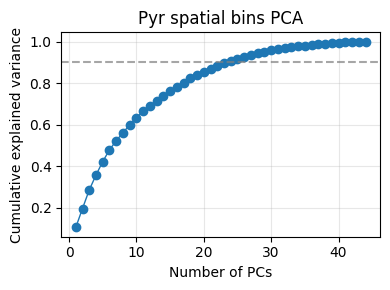

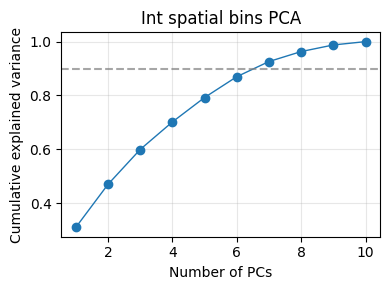

In [95]:
X_pyr, pca_pyr = umap_tools.preprocess_bins(pyr_mat, scale=True, pca_denoise=True, n_pcs=None)
X_int, pca_int = umap_tools.preprocess_bins(int_mat, scale=True, pca_denoise=True, n_pcs=None)

umap_tools.plot_pca_exp_var_from_bins(pca_pyr, title="Pyr spatial bins PCA")
umap_tools.plot_pca_exp_var_from_bins(pca_int, title="Int spatial bins PCA")

In [96]:
n_pyr_pc = 20
n_inter_pc = 6

In [97]:
def plot_explained_var(explained_var):
    plt.figure(figsize=(4, 3))
    plt.bar(np.arange(1, len(explained_var) + 1),
            explained_var,
            alpha=0.7)
    plt.plot(np.cumsum(explained_var), marker='.')
    plt.xlabel('Principal Component')
    plt.ylabel('Explained Variance Ratio')
    plt.title('PCA Explained Variance')
    plt.tight_layout()
    plt.show()

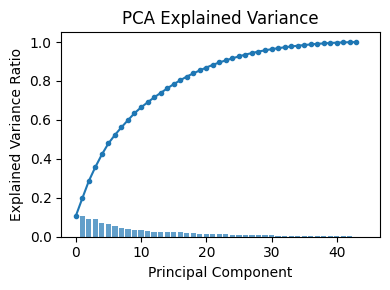

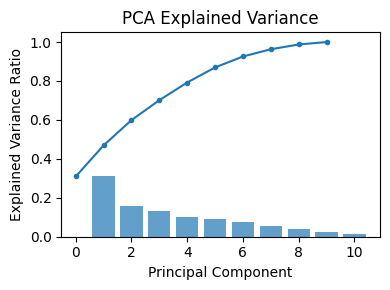

In [98]:
plot_explained_var(pca_pyr.explained_variance_ratio_)
plot_explained_var(pca_int.explained_variance_ratio_)

In [108]:
umap_kwargs = dict(n_neighbors=15, min_dist=0.1, metric="euclidean", random_state=42)

emb_pyr = umap_tools.run_umap_from_bins(X_pyr[:,:n_pyr_pc].T, umap_kwargs)
emb_pyr_split = umap_tools.split_embedding(emb_pyr, pyr_lengths, of_keys)

emb_int = umap_tools.run_umap_from_bins(X_int[:,:n_inter_pc].T, umap_kwargs)
emb_int_split = umap_tools.split_embedding(emb_int, int_lengths, of_keys)

/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [109]:
emb_pyr.shape, emb_int.shape


((853, 2), (853, 2))

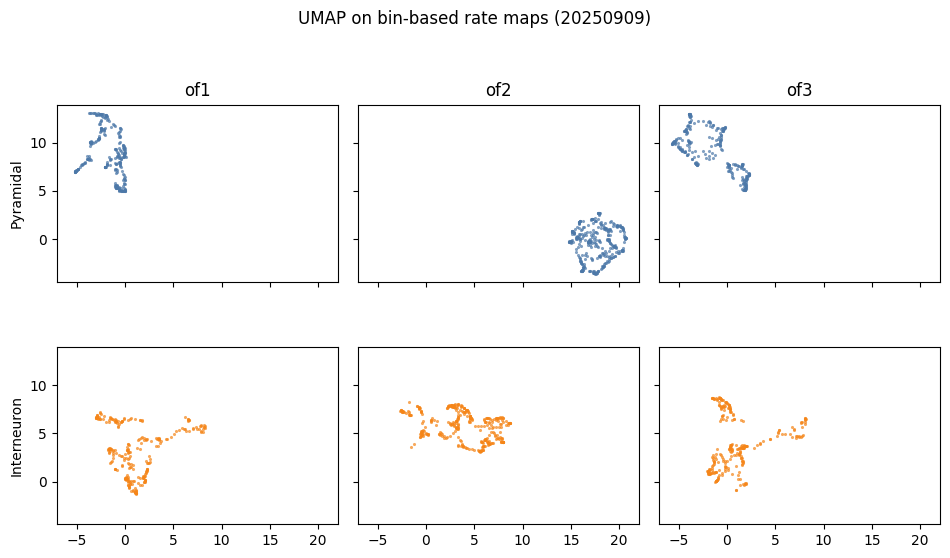

In [110]:
umap_tools.plot_umap_grid_by_class_bins(
    emb_pyr_split,
    emb_int_split,
    of_keys,
    date,
    save_path=pa_path / f"spatial_umap_pyr_int_grid_{date}.png"
)

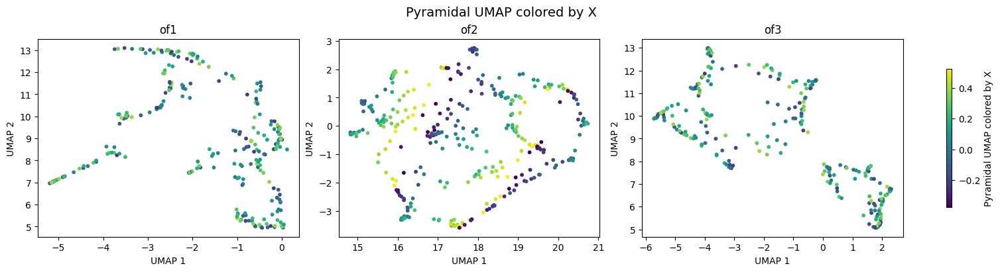

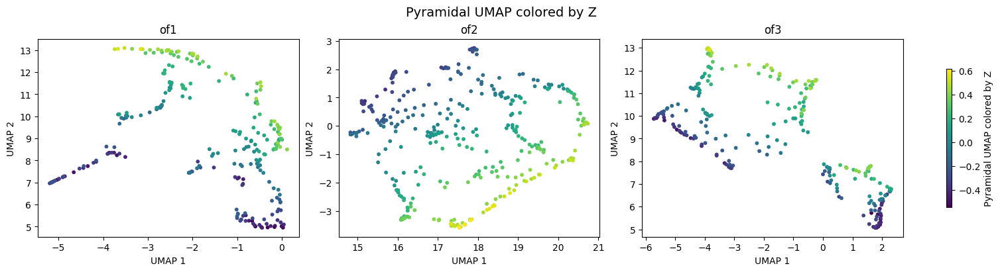

In [111]:
# Flatten X/Z bin centers for coloring
x_colors = {}
z_colors = {}
for of, mask in zip(of_keys, pyr_masks):
    x_flat, z_flat = umap_tools.get_flat_bin_coords(xy_bins, of)
    x_colors[of] = x_flat[mask]
    z_colors[of] = z_flat[mask]

# Plot UMAP colored by X
umap_tools.plot_umap_colored_by_scalar(
    emb_pyr_split,
    x_colors,
    of_keys,
    title="Pyramidal UMAP colored by X",
    save_path=pa_path / f"pyr_umap_X_{date}.png"
)

# Plot UMAP colored by Z
umap_tools.plot_umap_colored_by_scalar(
    emb_pyr_split,
    z_colors,
    of_keys,
    title="Pyramidal UMAP colored by Z",
    save_path=pa_path / f"pyr_umap_Z_{date}.png"
)


/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


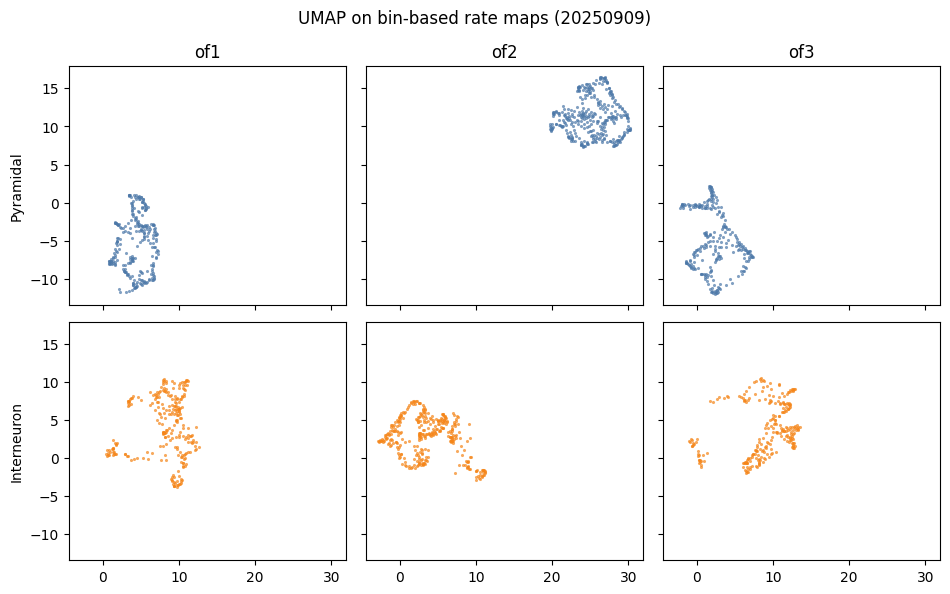

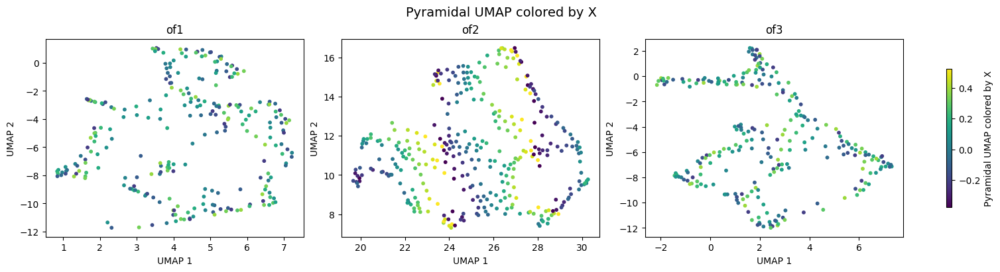

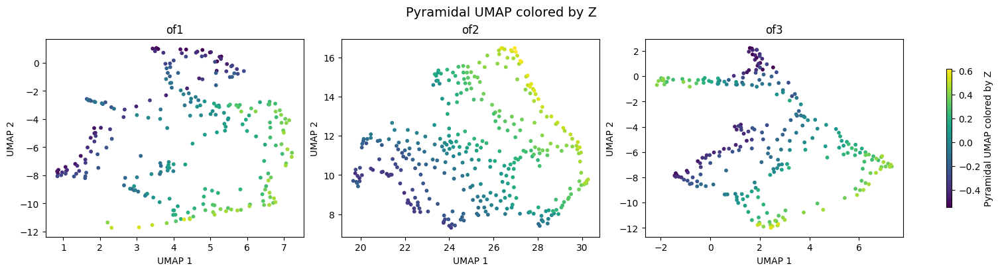

In [115]:
# cosine shit
umap_kwargs = dict(n_neighbors=15, min_dist=0.5, metric="cosine", random_state=42)

emb_pyr = umap_tools.run_umap_from_bins(X_pyr[:,:n_pyr_pc].T, umap_kwargs)
emb_pyr_split = umap_tools.split_embedding(emb_pyr, pyr_lengths, of_keys)

emb_int = umap_tools.run_umap_from_bins(X_int[:,:n_inter_pc].T, umap_kwargs)
emb_int_split = umap_tools.split_embedding(emb_int, int_lengths, of_keys)

umap_tools.plot_umap_grid_by_class_bins(
    emb_pyr_split,
    emb_int_split,
    of_keys,
    date,
    save_path=pa_path / f"spatial_umap_pyr_int_grid_{date}.png"
)

# Flatten X/Z bin centers for coloring
x_colors = {}
z_colors = {}
for of, mask in zip(of_keys, pyr_masks):
    x_flat, z_flat = umap_tools.get_flat_bin_coords(xy_bins, of)
    x_colors[of] = x_flat[mask]
    z_colors[of] = z_flat[mask]

# Plot UMAP colored by X
umap_tools.plot_umap_colored_by_scalar(
    emb_pyr_split,
    x_colors,
    of_keys,
    title="Pyramidal UMAP colored by X",
    save_path=pa_path / f"pyr_umap_X_{date}.png"
)

# Plot UMAP colored by Z
umap_tools.plot_umap_colored_by_scalar(
    emb_pyr_split,
    z_colors,
    of_keys,
    title="Pyramidal UMAP colored by Z",
    save_path=pa_path / f"pyr_umap_Z_{date}.png"
)

In [112]:
# from itertools import product

# for n, d in product([5, 15, 30], [0.01, 0.1, 0.5]):
#     umap_kwargs = dict(n_neighbors=n, min_dist=d, metric="euclidean", random_state=42)

#     emb_pyr = umap_tools.run_umap_from_bins(X_pyr[:,:n_pyr_pc].T, umap_kwargs)
#     emb_pyr_split = umap_tools.split_embedding(emb_pyr, pyr_lengths, of_keys)

#     emb_int = umap_tools.run_umap_from_bins(X_int[:,:n_inter_pc].T, umap_kwargs)
#     emb_int_split = umap_tools.split_embedding(emb_int, int_lengths, of_keys)
    

#     umap_tools.plot_umap_grid_by_class_bins(
#         emb_pyr_split,
#         emb_int_split,
#         of_keys,
#         date,
#         save_path=pa_path / f"spatial_umap_pyr_int_grid_{date}.png"
#     )

| **`n_neighbors ↓` / `min_dist →`** | **0.01** *(tight blobs)*                                             | **0.1** *(moderate spacing)*                                   | **0.5** *(spread out)*                                          |
| ---------------------------------- | -------------------------------------------------------------------- | -------------------------------------------------------------- | --------------------------------------------------------------- |
| **5** *(very local)*               | 🔬 **Over-clustered**<br>Tiny, dense blobs<br>May fragment structure | ✅ **Good cluster separation**<br>Balanced detail vs cohesion   | 🌌 **Loose scatter**<br>Clusters stay apart, but geometry fades |
| **15** *(balanced)*                | 🔎 **Local detail preserved**<br>Compact but interpretable clusters  | ⚖️ **Default UMAP look**<br>Nice manifold, visible structure   | 🌀 **Global manifold**<br>Structure emerges, less clustering    |
| **30** *(more global)*             | 🧩 **Large-scale structure**<br>Low-res local detail                 | 🌍 **Smooth embedding**<br>Continuous transitions, fewer edges | 🌊 **Very smooth**<br>Flattened embedding, topology emphasized  |


In [113]:
# from itertools import product

# for n, d in product([5, 15, 30], [0.01, 0.1, 0.5]):
#     umap_kwargs = dict(n_neighbors=n, min_dist=d, metric="euclidean", random_state=42)

#     emb_pyr = umap_tools.run_umap_from_bins(X_pyr[:,:n_pyr_pc].T, umap_kwargs)
#     emb_pyr_split = umap_tools.split_embedding(emb_pyr, pyr_lengths, of_keys)

#     print(f'n={n}, d={d}')
#     x_colors = {}
#     z_colors = {}
#     for of, mask in zip(of_keys, pyr_masks):
#         x_flat, z_flat = umap_tools.get_flat_bin_coords(xy_bins, of)
#         x_colors[of] = x_flat[mask]
#         z_colors[of] = z_flat[mask]

#     # Plot UMAP colored by X
#     umap_tools.plot_umap_colored_by_scalar(
#         emb_pyr_split,
#         x_colors,
#         of_keys,
#         title="Pyramidal UMAP colored by X",
#         save_path=pa_path / f"pyr_umap_X_{date}.png"
#     )

#     # Plot UMAP colored by Z
#     umap_tools.plot_umap_colored_by_scalar(
#         emb_pyr_split,
#         z_colors,
#         of_keys,
#         title="Pyramidal UMAP colored by Z",
#         save_path=pa_path / f"pyr_umap_Z_{date}.png"
#     )

| Aspect                        | **Euclidean** (`metric='euclidean'`)                                              | **Cosine** (`metric='cosine'`)                                                     |
| ----------------------------- | --------------------------------------------------------------------------------- | ---------------------------------------------------------------------------------- |
| 📐 **Definition**             | Straight-line distance in space| Angle between vectors                                     |
| 🔍 **Focuses on**             | **Magnitude** and direction                                                       | **Direction only** (ignores magnitude)                                             |
| 💡 **Good for**               | Data with meaningful **absolute values** or amplitudes (e.g., firing rate levels) | Data where **relative shape** or **pattern similarity** matters more than strength |
| 🧠 **Neuro example**          | Comparing cells with different **firing intensities**                             | Comparing **population activity patterns** regardless of firing rate               |
| 🧩 **Effect in UMAP**         | Spreads based on **amplitude differences**                                        | Groups units with **similar tuning curves**, even if weak                          |
| 🔬 **Invariance to scaling?** | ❌ No — scaling matters                                                            | ✅ Yes — pattern shape matters more                                                 |
| ⚠️ **Caveat**                 | Can overemphasize **strong signals**                                              | Sensitive to noise in **low-magnitude signals**                                    |


In [114]:
# from itertools import product

# for n, d in product([5, 15, 30], [0.01, 0.1, 0.5]):
#     umap_kwargs = dict(n_neighbors=n, min_dist=d, metric="cosine", random_state=42)

#     emb_pyr = umap_tools.run_umap_from_bins(X_pyr[:,:n_pyr_pc].T, umap_kwargs)
#     emb_pyr_split = umap_tools.split_embedding(emb_pyr, pyr_lengths, of_keys)

#     print(f'n={n}, d={d}')
#     x_colors = {}
#     z_colors = {}
#     for of, mask in zip(of_keys, pyr_masks):
#         x_flat, z_flat = umap_tools.get_flat_bin_coords(xy_bins, of)
#         x_colors[of] = x_flat[mask]
#         z_colors[of] = z_flat[mask]

#     # Plot UMAP colored by X
#     umap_tools.plot_umap_colored_by_scalar(
#         emb_pyr_split,
#         x_colors,
#         of_keys,
#         title="Pyramidal UMAP colored by X",
#         save_path=pa_path / f"pyr_umap_X_{date}.png"
#     )

#     # Plot UMAP colored by Z
#     umap_tools.plot_umap_colored_by_scalar(
#         emb_pyr_split,
#         z_colors,
#         of_keys,
#         title="Pyramidal UMAP colored by Z",
#         save_path=pa_path / f"pyr_umap_Z_{date}.png"
#     )

### Pitch

In [116]:
of_keys = ['of1', 'of2', 'of3']

# Load pitch-binned rate maps
pitch_dict = umap_tools.load_pitch_map_dict(res_path, date, of_keys)

unit_order = data['cell_ids'][of_keys[0]]  # ensures consistent neuron order
all_units, pyr_units, inter_units = umap_tools.neuronal_classes(
    unit_class_path,
    unit_order
)

# Pyramidal
pyr_mat, pyr_masks, pyr_lengths = umap_tools.build_across_conditions(
    umap_tools.build_population_matrix_1d,
    pitch_dict,
    pyr_units,
    of_keys
)

# Interneurons
int_mat, int_masks, int_lengths = umap_tools.build_across_conditions(
    umap_tools.build_population_matrix_1d,
    pitch_dict,
    inter_units,
    of_keys
)

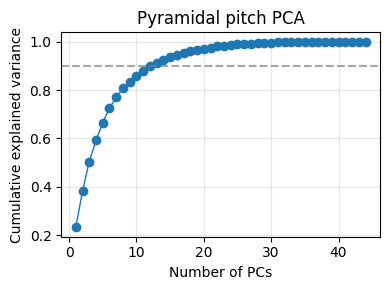

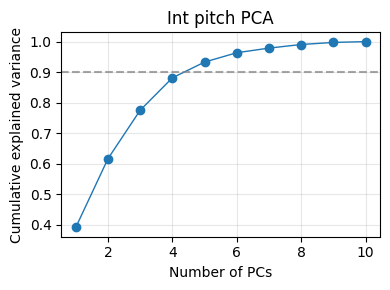

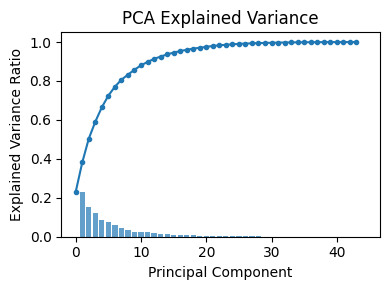

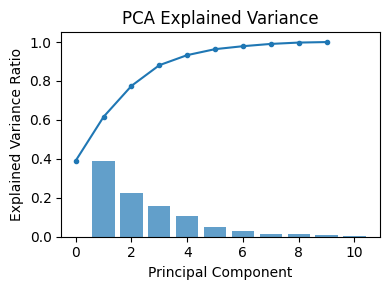

In [117]:
X_pyr, pca_pyr = umap_tools.preprocess_bins(pyr_mat, scale=True, pca_denoise=True, n_pcs=None)
X_int, pca_int = umap_tools.preprocess_bins(int_mat, scale=True, pca_denoise=True, n_pcs=None)

umap_tools.plot_pca_exp_var_from_bins(pca_pyr, title="Pyramidal pitch PCA")
umap_tools.plot_pca_exp_var_from_bins(pca_int, title="Int pitch PCA")

plot_explained_var(pca_pyr.explained_variance_ratio_)
plot_explained_var(pca_int.explained_variance_ratio_)

In [118]:
n_pyr_pc = 10
n_inter_pc = 4

/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


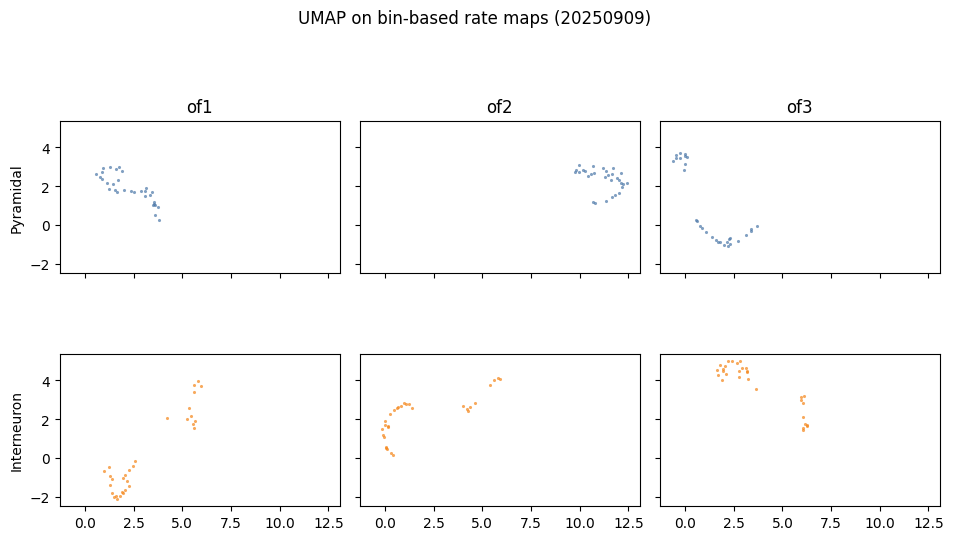

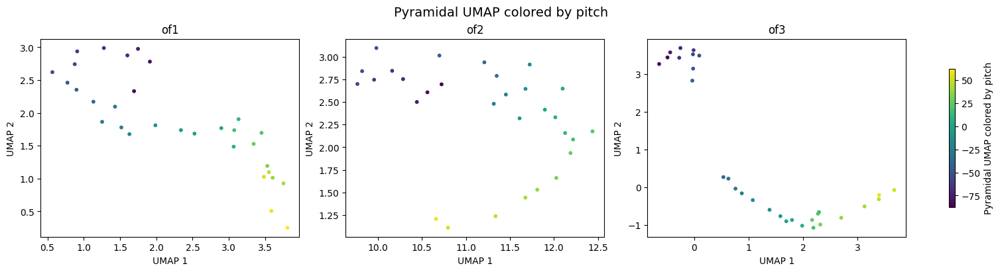

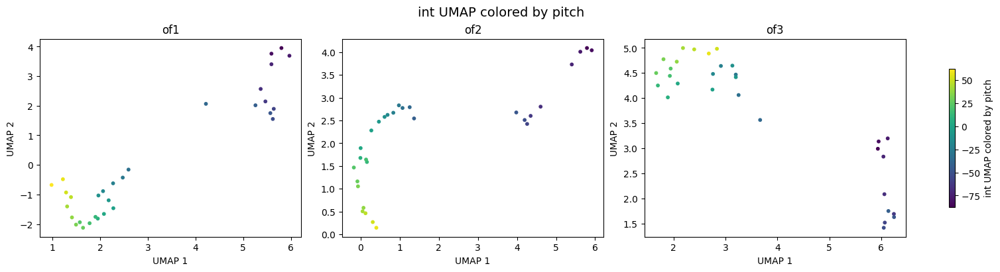

In [119]:
umap_kwargs = dict(n_neighbors=15, min_dist=0.1, metric="euclidean", random_state=42)

emb_pyr = umap_tools.run_umap_from_bins(X_pyr.T, umap_kwargs)
emb_pyr_split = umap_tools.split_embedding(emb_pyr, pyr_lengths, of_keys)

emb_int = umap_tools.run_umap_from_bins(X_int.T, umap_kwargs)
emb_int_split = umap_tools.split_embedding(emb_int, int_lengths, of_keys)

umap_tools.plot_umap_grid_by_class_bins(
    emb_pyr_split,
    emb_int_split,
    of_keys,
    date,
    save_path=pa_path / f"pitch_umap_pyr_int_grid_{date}.png"
)

# Build color mapping: pitch centers for each valid bin
pyr_pitch_colors = {
    of: pitch_dict[of]['pitch_centers'][mask]
    for of, mask in zip(of_keys, pyr_masks)
}

umap_tools.plot_umap_colored_by_scalar(
    emb_pyr_split,
    pyr_pitch_colors,
    of_keys,
    title="Pyramidal UMAP colored by pitch",
    save_path=pa_path / f"pyr_pitch_umap_colored_{date}.png"
)

# Build color mapping: pitch centers for each valid bin
int_pitch_colors = {
    of: pitch_dict[of]['pitch_centers'][mask]
    for of, mask in zip(of_keys, int_masks)
}

umap_tools.plot_umap_colored_by_scalar(
    emb_int_split,
    int_pitch_colors,
    of_keys,
    title="int UMAP colored by pitch",
    save_path=pa_path / f"int_pitch_umap_colored_{date}.png"
)

/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/storage3/eva/apps/anaconda3/envs/nma/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


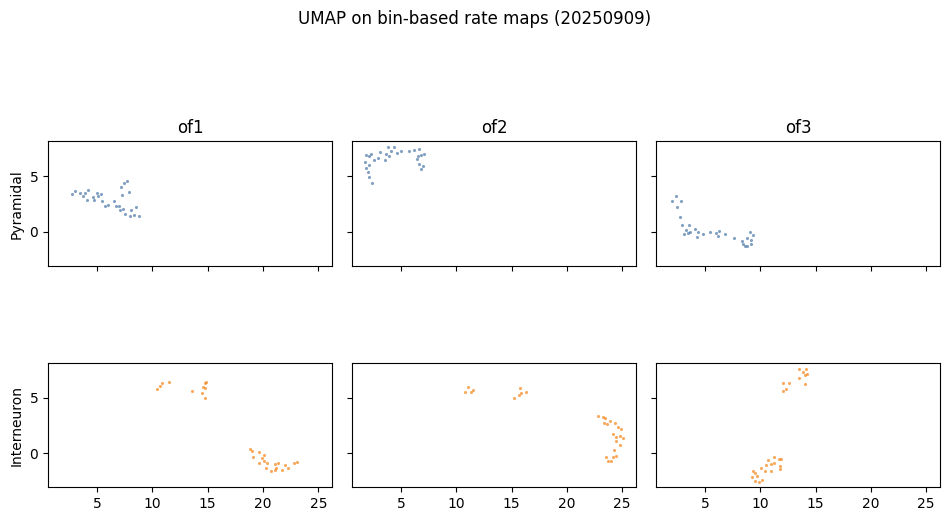

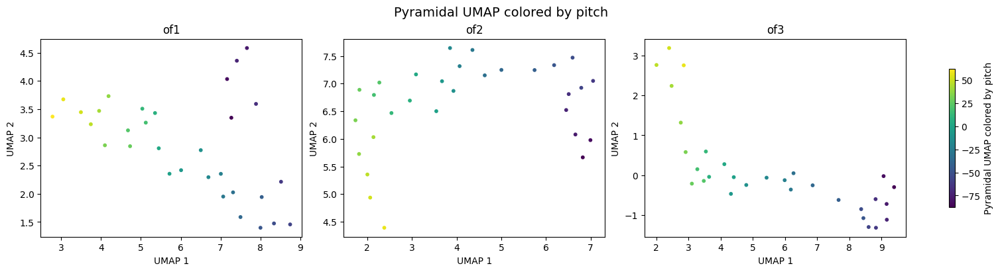

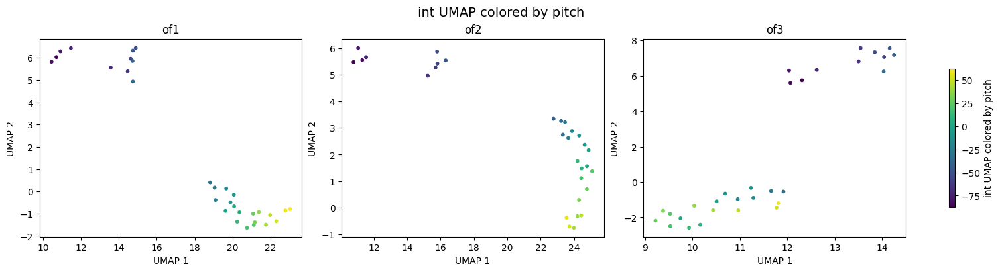

In [120]:
umap_kwargs = dict(n_neighbors=15, min_dist=0.5, metric="cosine", random_state=42)

emb_pyr = umap_tools.run_umap_from_bins(X_pyr.T, umap_kwargs)
emb_pyr_split = umap_tools.split_embedding(emb_pyr, pyr_lengths, of_keys)

emb_int = umap_tools.run_umap_from_bins(X_int.T, umap_kwargs)
emb_int_split = umap_tools.split_embedding(emb_int, int_lengths, of_keys)

umap_tools.plot_umap_grid_by_class_bins(
    emb_pyr_split,
    emb_int_split,
    of_keys,
    date,
    save_path=pa_path / f"pitch_umap_pyr_int_grid_{date}.png"
)

# Build color mapping: pitch centers for each valid bin
pyr_pitch_colors = {
    of: pitch_dict[of]['pitch_centers'][mask]
    for of, mask in zip(of_keys, pyr_masks)
}

umap_tools.plot_umap_colored_by_scalar(
    emb_pyr_split,
    pyr_pitch_colors,
    of_keys,
    title="Pyramidal UMAP colored by pitch",
    save_path=pa_path / f"pyr_pitch_umap_colored_{date}.png"
)

# Build color mapping: pitch centers for each valid bin
int_pitch_colors = {
    of: pitch_dict[of]['pitch_centers'][mask]
    for of, mask in zip(of_keys, int_masks)
}

umap_tools.plot_umap_colored_by_scalar(
    emb_int_split,
    int_pitch_colors,
    of_keys,
    title="int UMAP colored by pitch",
    save_path=pa_path / f"int_pitch_umap_colored_{date}.png"
)